# Improved BiGAN model

List of improvements


*   Least square loss instead of binary crossentropy
*   Instance layer normalization instead of batch normalization
*   Reconstruction loss added to the adversarial loss



## Setting the environment and data preprocessing

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
print("List of available GPUs: ", gpus)
if gpus:
  # Restrict TensorFlow to only use the first GPUGPU
  try:
    tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
    tf.config.experimental.set_memory_growth(gpus[0], True)
    print("Correctly set gpu: ", gpus[0])
  except RuntimeError as e:
    # Visible devices must be set before GPUs have been initialized
    print(e)

List of available GPUs:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Correctly set gpu:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
!pip install tensorflow_addons
!pip install tensorflow_io
!pip install git+https://github.com/tensorflow/docs

     |████████████████████████████████| 1.1 MB 7.3 MB/s 
     |████████████████████████████████| 23.4 MB 54.9 MB/s 
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-nzvuzs3d
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-nzvuzs3d
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=173953 sha256=59aa263d1f97d1cfb5e44ae7b63152bb5404eef4134ad1fdbaef1800e082096d
  Stored in directory: /tmp/pip-ephem-wheel-cache-pr0wem6v/wheels/cc/c4/d8/5341e93b6376c5c929c49469fce21155eb69cef1a4da4ce32c
Successfully built tensorflow-docs


In [ ]:
import glob
import imageio
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import os
from PIL import Image
from tensorflow.keras import layers
import time
import random
import tensorflow.keras.backend as K
import tensorflow_addons as tfa
import tensorflow_io as tfio
import math
import tensorflow_docs.vis.embed as embed
from IPython import display
import ipywidgets as widgets
from datetime import datetime
from sklearn import metrics
import shutil

%matplotlib inline

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
DATA_PATH = "/content/gdrive/MyDrive/Datasets/Grid"
BASE_PATH = os.getcwd()
os.mkdir("models")

In [ ]:
BATCH_SIZE = 64

## number of cropped images from each orginal image
BUFFER = 50000
## shape of the box that will be cut from the orignal image
BOX_SHAPE = 64

## setting seed
SEED = 42
os.environ['PYTHONHASHSEED']=str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# noise dimension used by the generator
noise_dim = 128

## setting path
# DATA_PATH = "Nanofiber\\Normal"
MODEL_PATH = os.path.join(os.getcwd() + '/models/grid')

MODEL_NAME = "FCBiGAN_256"

sub_path = os.path.join(MODEL_PATH, MODEL_NAME)

if not os.path.exists(sub_path):
  os.makedirs(sub_path)

now = datetime.now()
dt_string = now.strftime("%d-%m-%Y %Hh%Mm")

modelsave_path = "model_" + dt_string
modelsave_path = os.path.join(sub_path, modelsave_path)

img_dir = 'image_progression' + dt_string
img_dir = os.path.join(sub_path, img_dir)


checkpoint_dir = 'bigan_training_checkpoints' + dt_string
checkpoint_dir = os.path.join(sub_path, checkpoint_dir)

if not os.path.exists(checkpoint_dir):

  older_checkpoints_dir = [dn[0] for dn in
                           os.walk(os.path.dirname(checkpoint_dir)) if
                           'checkpoints' in dn[0]]
  for dir in older_checkpoints_dir:
    shutil.rmtree((dir))

  os.mkdir(checkpoint_dir)
else:
  print("directory already there")

if not os.path.exists(img_dir):

  older_img_dir = [dn[0] for dn in
                           os.walk(os.path.dirname(img_dir)) if
                           'image' in dn[0]]

  for old_dir in older_img_dir:
    shutil.rmtree(old_dir)

  os.mkdir(img_dir)
else:
  print("directory already there")

#DATA_PATH = "Nanofiber\\Normal"


In [ ]:
## Input: image PIL image object
## Output: dictionary with image size and channels
def get_img_info(img):

    img_info = {}

    img_info['format'] = img.format
    img_info['size'] = img.size
    img_info['channels'] = len(img.getbands())

    if img_info['channels'] == 1:
        plt.set_cmap("gray")

    return img_info

In [ ]:
full_path = os.path.join(DATA_PATH, 'training')

('format', 'PNG')
('size', (1024, 1024))
('channels', 1)


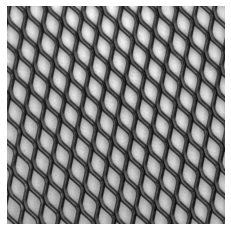

In [ ]:
sample_img = Image.open(full_path + '/000.png')
img_info = get_img_info(sample_img)

plt.imshow(sample_img)
plt.axis('off')

for item in img_info.items():
    print(item)

### Dataset Preprocessing

In [ ]:
normalization_layer = tf.keras.layers.experimental.preprocessing.Rescaling(1./127.5, offset=-1)
AUTOTUNE = tf.data.experimental.AUTOTUNE

@tf.function
def preprocess_img(img, img_info, resize_shape=None):

  if img_info['format'].lower() == 'png':
    img = tf.io.decode_png(img, channels=img_info['channels'])
  elif img_info['format'].lower() == 'tiff':

    size = img_info['size']
    img = tfio.experimental.image.decode_tiff(img)
    ## decode tiff does not automatically infer shape as
    ## decode png, hence the shape must be explicitly set
    img = tf.ensure_shape(img, [size[1], size[0], 4])
    img = tfio.experimental.color.rgba_to_rgb(img)

    if img_info['channels'] == 1:
      img = tfio.experimental.color.rgb_to_grayscale(img)

  if resize_shape:
    img = tf.keras.preprocessing.image.smart_resize(img, size=resize_shape)

  img = normalization_layer(img)

  return img

@tf.function
def data_augm(image):

    image = tf.image.random_flip_up_down(image, seed=SEED)
    image = tf.image.random_flip_left_right(image, seed=SEED)

    if tf.random.normal((), seed=SEED) > 0.5:
        image = tf.image.rot90(image)

    return image

@tf.function
def denormalize(img):
  img = img * 127.5 + 127.5
  return tf.cast(img, tf.int32)

@tf.function
def random_crop(img, crop_shape, channels):

  img_crop = tf.image.random_crop(img,
                                  size=[crop_shape, crop_shape, channels],
                                  seed=SEED)

  return img_crop

In [ ]:
# extracting file names
filename_ds = tf.data.Dataset.from_tensor_slices(glob.glob(full_path + "/*"))

# reading files from filenames
image_ds = filename_ds.map(tf.io.read_file)

# size of the dataset
ds_size = tf.data.experimental.cardinality(image_ds).numpy()

# ratio of validation data
val_split = 0.1

# train dataset
train_ds = image_ds.skip(int(val_split*ds_size))

val_ds = image_ds.take(int(val_split*ds_size))

train_patchperimg = math.ceil(BUFFER/int((1-val_split)*ds_size))

val_ds_size = tf.data.experimental.cardinality(image_ds).numpy()
val_patchperimg = math.ceil((BUFFER*0.1)/int(val_split*ds_size))

train_ds = train_ds.map(lambda x:
                        preprocess_img(x, img_info, (256, 256)),
                        num_parallel_calls=AUTOTUNE).cache()

train_ds = train_ds.repeat(train_patchperimg).map(lambda x:
                                            random_crop(x, BOX_SHAPE, img_info['channels']),
                                            num_parallel_calls=AUTOTUNE)

train_fixed_ds = list(train_ds.as_numpy_iterator())
train_ds = tf.data.Dataset.from_tensor_slices(train_fixed_ds)


val_ds = val_ds.map(lambda x:
                    preprocess_img(x, img_info, (256, 256)),
                    num_parallel_calls=AUTOTUNE).cache()

val_ds = val_ds.repeat(val_patchperimg).map(lambda x:
                                            random_crop(x, BOX_SHAPE, img_info['channels']),
                                            num_parallel_calls=AUTOTUNE)

val_fixed_ds = list(val_ds.as_numpy_iterator())
val_ds = tf.data.Dataset.from_tensor_slices(val_fixed_ds)

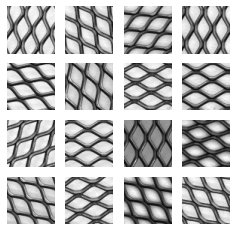

In [ ]:
monitor_batch = next(iter(train_ds.batch(16)))

plt.figure(figsize=(4, 4))

for i, image in enumerate(monitor_batch):

  ax = plt.subplot(4, 4, i + 1)
  plt.imshow((denormalize(image[:,:,0])))
  plt.axis("off")


In [ ]:
val_ds = val_ds.cache().batch(BATCH_SIZE).prefetch(AUTOTUNE)
train_ds = train_ds.cache().shuffle(BUFFER, seed=SEED).batch(BATCH_SIZE).prefetch(AUTOTUNE)

## BiGAN submodels

In [ ]:
class ReflectionPadding2D(layers.Layer):
    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def compute_output_shape(self, input_shape):
        return (input_shape[0], input_shape[1] + 2 * self.padding[0],
                input_shape[2] + 2 * self.padding[1], input_shape[3])

    def get_config(self):
        config = super(ReflectionPadding2D, self).get_config()
        config.update({"padding": self.padding})
        return config

    def from_config(config):
        return ReflectionPadding2D(**config)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        return tf.pad(input_tensor, [[0,0], [padding_height, padding_height],
                      [padding_width, padding_width], [0,0] ], 'REFLECT')

In [ ]:
class DepthToSpace(layers.Layer):

    def __init__(self, block_size=1, **kwargs):
        self.block_size = block_size
        super(DepthToSpace, self).__init__(**kwargs)

    def get_config(self):
        config = super(DepthToSpace, self).get_config()
        config.update({"block_size": self.block_size})
        return config

    def from_config(config):
        return DepthToSpace(**config)


    def call(self, input_tensor, mask=None):
        block_size = self.block_size
        return tf.nn.depth_to_space(input_tensor, block_size)

### Basic block

In [ ]:
init = tf.random_normal_initializer(0., 0.02, seed=SEED)

def Conv_block(filters,
               activation,
               kernel_size=3,
               strides=1,
               custom_padding=None,
               use_bias=False,
               use_norm=False,
               kernel_regularizer=None,
               activity_regularizer=None,
               use_dropout=False,
               drop_value=0.1,
               down_factor=0,
               up_factor=0,
               dilation_rate=(1,1)):


    def apply(x):

        if up_factor > 0:
            x = layers.UpSampling2D((up_factor, up_factor))(x)

        if custom_padding == 'reflection':
            x = ReflectionPadding2D((kernel_size//2, kernel_size//2))(x)
            padding = 'valid'
        elif custom_padding == 'same':
            padding = 'same'
        else:
            padding = 'valid'

        x = layers.Conv2D(filters, kernel_size, strides=strides,
                            padding=padding, use_bias=use_bias,
                            kernel_regularizer=kernel_regularizer,
                            activity_regularizer=activity_regularizer,
                            dilation_rate=dilation_rate,
                            kernel_initializer=init)(x)

        if use_norm:
            x = tfa.layers.GroupNormalization(groups=16)(x)

        if activation:
            x = activation(x)

        if down_factor > 0:
            x = layers.AveragePooling2D((down_factor, down_factor))(x)

        if use_dropout:
            x = layers.SpatialDropout2D(drop_value, seed=SEED)(x)

        return x

    return apply

## Discriminator

In [ ]:
def build_discriminator(img_shape=(128,128,1), noise_shape=128, filters=(64, 128, 256)):

  ## input
  img_input = layers.Input(img_shape)
  noise_input = layers.Input(noise_shape)

  ## projecting latent code to image dimension, using convolutions
  ## (Pixel Shuffle).
  z = layers.Reshape((1,1,noise_shape))(noise_input)
  z = layers.Conv2DTranspose(64, 8, 1, padding='valid',
                            activation='tanh',
                            kernel_initializer='orthogonal')(z)
  z = layers.SpatialDropout2D(0.5, seed=SEED)(z)
  z = DepthToSpace(8)(z)

  x = layers.Concatenate()([img_input, z])

  for filter in filters:

    if filter == filters[0]:
      use_drop = False
    else:
      use_drop = True

    x = Conv_block(filter, layers.LeakyReLU(0.2), 3, 1,
                  use_bias=True, use_dropout=use_drop,
                  drop_value=0.2, custom_padding='same')(x)
    x = Conv_block(filter, layers.LeakyReLU(0.2), 3, down_factor=2,
                  use_bias=True, use_dropout=True,
                  drop_value=0.2, custom_padding='same')(x)

  x = Conv_block(filters[-1], layers.LeakyReLU(0.2), 3, 1,
                use_bias=True, use_dropout=True, drop_value=0.2,
                custom_padding='same')(x)

  x = layers.Conv2D(1, x.shape[1], 1, padding='valid', kernel_initializer=init)(x)
  x = layers.Reshape((1,))(x)

  d_model = tf.keras.models.Model([img_input, noise_input], x, name="Discriminator")

  return d_model

d_model = build_discriminator(img_shape=(BOX_SHAPE, BOX_SHAPE, img_info['channels']), noise_shape=noise_dim)
d_model.summary()

Model: "Discriminator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128)]        0           []                               
                                                                                                  
 reshape (Reshape)              (None, 1, 1, 128)    0           ['input_2[0][0]']                
                                                                                                  
 conv2d_transpose (Conv2DTransp  (None, 8, 8, 64)    524352      ['reshape[0][0]']                
 ose)                                                                                             
                                                                                                  
 spatial_dropout2d (SpatialDrop  (None, 8, 8, 64)    0           ['conv2d_transpose[0]



### Generator

In [ ]:
def build_generator(latent_dim=128, filters=(256, 128, 64), out_channels=1):

  input_layer = layers.Input(latent_dim)
  x = layers.Reshape((1,1,latent_dim))(input_layer)
  x = layers.Conv2DTranspose(filters[0], 8, 1, padding='valid', use_bias=False,
                              kernel_initializer=init)(x)
  x = tfa.layers.GroupNormalization(groups=16)(x)
  x = layers.LeakyReLU(0.2)(x)
  x = layers.SpatialDropout2D(0.4, seed=SEED)(x)

  for filter in filters:
    x = Conv_block(filter, layers.LeakyReLU(0.2), 3, up_factor=2, use_norm=True,
                    use_bias=False, use_dropout=True, drop_value=0.2,
                    custom_padding='reflection')(x)
    x = Conv_block(filter, layers.LeakyReLU(0.2), 3, 1, use_norm=True,
                    use_bias=False, use_dropout=True, drop_value=0.2,
                    custom_padding='reflection')(x)

  x = Conv_block(out_channels, layers.Activation('tanh'), 3, 1, use_norm=False, use_bias=False,
                custom_padding='reflection')(x)

  g_model = tf.keras.models.Model([input_layer], x, name='Generator')

  return g_model

g_model = build_generator(latent_dim=noise_dim, out_channels=img_info['channels'])
g_model.summary()

Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128)]             0         
                                                                 
 reshape_2 (Reshape)         (None, 1, 1, 128)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 8, 8, 256)        2097152   
 ranspose)                                                       
                                                                 
 group_normalization (GroupN  (None, 8, 8, 256)        512       
 ormalization)                                                   
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 8, 8, 256)         0         
                                                                 
 spatial_dropout2d_7 (Spatia  (None, 8, 8, 256)        0 

### Encoder

In [ ]:
def build_encoder(img_shape=(128,128,1), filters=(64, 128, 256)):

  input_layer = layers.Input(img_shape)

  x = input_layer

  for filter in filters[:]:

    if filter == filters[0]:
      norm = False
      use_drop = False
    else:
      norm = True
      use_drop = True

    x = Conv_block(filter, layers.LeakyReLU(0.2), 3, 1,use_norm=norm,
                  use_bias=False, use_dropout=use_drop, drop_value=0.2,
                  custom_padding='reflection')(x)
    x = Conv_block(filter, layers.LeakyReLU(0.2), 3, down_factor = 2,use_norm=True,
                  use_bias=False, use_dropout=True, drop_value=0.2,
                  custom_padding='reflection')(x)

  x = Conv_block(filters[-1], layers.LeakyReLU(0.2), 3, 1, use_norm=True,
                use_bias=False, use_dropout=True, drop_value=0.2,
                custom_padding='reflection')(x)

  x = layers.Conv2D(128, x.shape[1], 1, padding='valid', use_bias=False, kernel_initializer=init)(x)
  x = layers.Reshape((128,))(x)

  e_model = tf.keras.models.Model([input_layer], x, name="Encoder")

  return e_model

e_model = build_encoder(img_shape=(BOX_SHAPE, BOX_SHAPE, img_info['channels']))
e_model.summary()

Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 64, 64, 1)]       0         
                                                                 
 reflection_padding2d_7 (Ref  (None, 66, 66, 1)        0         
 lectionPadding2D)                                               
                                                                 
 conv2d_15 (Conv2D)          (None, 64, 64, 64)        576       
                                                                 
 leaky_re_lu_14 (LeakyReLU)  (None, 64, 64, 64)        0         
                                                                 
 reflection_padding2d_8 (Ref  (None, 66, 66, 64)       0         
 lectionPadding2D)                                               
                                                                 
 conv2d_16 (Conv2D)          (None, 64, 64, 64)        3686

## BiGAN training

In [ ]:
class BIGAN(tf.keras.Model):
  def __init__(
      self,
      discriminator,
      generator,
      encoder,
      latent_dim,
      discriminator_steps=1,
      genenc_steps=1,
      id_weight=10.0
  ):

    super(BIGAN, self).__init__()
    self.discriminator = discriminator
    self.generator = generator
    self.encoder = encoder
    self.id_weight = id_weight
    self.latent_dim = latent_dim
    self.d_steps = discriminator_steps
    self.ge_steps = genenc_steps

  def compile(self, d_optimizer, g_optimizer, e_optimizer,
              d_loss_fn, g_loss_fn, e_loss_fn, rec_loss_fn):
    super(BIGAN, self).compile()
    self.d_optimizer = d_optimizer
    self.g_optimizer = g_optimizer
    self.e_optimizer = e_optimizer
    self.d_loss_fn = d_loss_fn
    self.g_loss_fn = g_loss_fn
    self.e_loss_fn = e_loss_fn
    self.rec_loss_fn = rec_loss_fn

  def train_step(self, real_images):
    if isinstance(real_images, tuple):
      real_images = real_images[0]

    # Batch size
    batch_size = tf.shape(real_images)[0]


    for i in range(self.d_steps):
        random_latent_vectors = tf.random.normal(
              shape=(batch_size, self.latent_dim)
        )

        with tf.GradientTape(persistent=True) as d_tape:
          # Generate fake images from the latent vector
          fake_images = self.generator([random_latent_vectors], training=True)

          enc_noises = self.encoder([real_images], training=True)

          fake_outs = self.discriminator([fake_images, random_latent_vectors],
                                             training=True)

          real_outs = self.discriminator([real_images, enc_noises],
                                              training=True)

          # Calculate discriminator loss using fake and real logits
          d_loss = self.d_loss_fn(real_outs, fake_outs)

        # Get gradients w.r.t discriminator loss
        d_gradient = d_tape.gradient(d_loss, self.discriminator.trainable_variables)
        # Update the weights of the discriminator using the discriminator optimizer
        self.d_optimizer.apply_gradients(
             zip(d_gradient, self.discriminator.trainable_variables)
        )

    for i in range(self.ge_steps):
        random_latent_vectors = tf.random.normal(
              shape=(batch_size, self.latent_dim)
        )

        with tf.GradientTape(persistent=True) as ge_tape:
          # Generate fake images from the latent vector
          fake_images = self.generator([random_latent_vectors],
                                        training=True)

          enc_noises = self.encoder([real_images], training=True)

          rec_images = self.generator([enc_noises], training=True)


          fake_outs = self.discriminator([fake_images, random_latent_vectors],
                                             training=True)

          real_outs = self.discriminator([real_images, enc_noises],
                                              training=True)

          id_loss = self.rec_loss_fn(real_images, rec_images)

          wid_loss = self.id_weight * id_loss

          # Calculate discriminator loss using fake and real logits
          adv_g_loss = self.g_loss_fn(fake_outs)
          adv_e_loss = self.e_loss_fn(real_outs)

          g_loss = adv_g_loss #+ wid_loss
          e_loss = adv_e_loss + wid_loss

        g_gradient = ge_tape.gradient(g_loss,
                                    self.generator.trainable_variables)

        # Update weights of the generator using generator optimizer
        self.g_optimizer.apply_gradients(
            zip(g_gradient, self.generator.trainable_variables)
        )


        e_gradient = ge_tape.gradient(e_loss,
                                    self.encoder.trainable_variables)

        self.e_optimizer.apply_gradients(
            zip(e_gradient, self.encoder.trainable_variables)
        )

    return {"d_loss": d_loss, "g_loss": adv_g_loss, "e_loss": adv_e_loss,
            "id_loss": id_loss}


In [ ]:
class GANMonitor(tf.keras.callbacks.Callback):
  def __init__(self, img_batch = 16, noise_dim=100, seed_images=None):
    # Saving a batch of noise to see the generator improvements
    self.seed_noise = tf.random.normal([img_batch, noise_dim])
    self.seed_images = seed_images
    self.out = widgets.Output()

  def on_train_begin(self, logs):
    # Initializing the display widget.
    display.display(self.out)

  def on_epoch_end(self, epoch, logs):

    enc_noises = self.model.encoder(self.seed_images, training=False)
    encoded_images = self.model.generator(enc_noises, training=False)
    gen_images = self.model.generator(self.seed_noise, training=False)

    # denormalizing the pixel values
    encoded_images = denormalize(encoded_images)
    gen_images = denormalize(gen_images)
    seed_images = denormalize(self.seed_images)

    # After each epoch the image containing the generator output
    # is refreshed
    with self.out:
      self.out.clear_output()


    # plot subplot of subplot using gridspec
    fig = plt.figure(figsize=(12.2, 4))
    outer = fig.add_gridspec(1, 3, figure=fig, hspace=0, wspace=0.1)


    titles = ["Original images", "Reconstructed Images", "Random Generated Images"]
    for i in range(len(titles)):
      ax = fig.add_subplot(outer[i], xticks=[], yticks=[] )
      ax.axis('off')
      ax.set_title(titles[i])


    # image shown as 3x3 grid of image tiles
    inner = outer[0].subgridspec(4,4, wspace=0.2, hspace=0.2)
    for i in range(self.seed_images.shape[0]):
        ax1 = fig.add_subplot(inner[i], xticks=[], yticks=[], aspect='equal')
        ax1.imshow(list(seed_images)[i][:,:,0])


    # image shown as 3x3 grid of image tiles
    inner = outer[1].subgridspec(4,4,wspace=0.2, hspace=0.2)
    for i in range(encoded_images.shape[0]):
        ax2 = fig.add_subplot(inner[i], xticks=[], yticks=[], aspect='equal')
        ax2.imshow(encoded_images[i][:,:,0])

    # image shown as 3x3 grid of image tiles
    inner = outer[2].subgridspec(4,4,wspace=0.2, hspace=0.2)
    for i in range(gen_images.shape[0]):
        ax2 = fig.add_subplot(inner[i], xticks=[], yticks=[], aspect='equal')
        ax2.imshow(gen_images[i][:,:,0])


    # Saving the output image after 5 epochs
    if epoch % 5 == 0:
      img_name = 'image_at_epoch_{:04d}.png'.format(epoch)
      img_path = os.path.join(img_dir, img_name)
      plt.savefig(img_path)

    # showing the image
    with self.out:
      plt.show()

ganmonitor = GANMonitor(noise_dim=noise_dim, seed_images=monitor_batch)


In [ ]:
# Validation metrics callback: validation precision, recall and F1
class CustomProgbarLogger(tf.keras.callbacks.ProgbarLogger):

    def __init__(self, validation_data, count_mode='samples'):
      # Saving a batch of noise to see the generator improvements
      super(CustomProgbarLogger, self).__init__(count_mode)
      self.validation_data = validation_data

    def on_train_begin(self, logs):
      self.val_losses = []
      self.val_loss = 0


    def on_epoch_end(self, epoch, logs):

      batch_losses = []

      for val_batch in self.validation_data:
        encoded_noises = self.model.encoder([val_batch], training=False)
        reconstructed_images = self.model.generator([encoded_noises], training=False)

        batch_loss = self.model.rec_loss_fn(val_batch, reconstructed_images)
        batch_losses.append(batch_loss)

      self.val_loss = np.mean(batch_losses)

      self.val_losses.append(self.val_loss)

      # Add custom metrics to the logs, so that we can use them with
      # EarlyStop and csvLogger callbacks
      #self.model.metrics_names["val_loss"] = self.val_loss
      logs['val_loss'] = self.val_loss
      self.progbar.update(self.seen,(list(logs.items())), finalize=True)

progbar = CustomProgbarLogger(count_mode='steps', validation_data=val_ds)

## Losses

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(5e-4, beta_1=0, beta_2=0.99)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0, beta_2=0.99)
encoder_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0, beta_2=0.99)

mse = tf.keras.losses.MeanSquaredError()
mae = tf.keras.losses.MeanAbsoluteError()

# Define the loss functions to be used for discrimiator
# This should be (fake_loss - real_loss)
# We will add the gradient penalty later to this loss function
def discriminator_loss(real_img, fake_img):
    real_loss = mse(tf.ones_like(real_img), real_img)
    fake_loss = mse(tf.zeros_like(fake_img), fake_img)
    return (fake_loss + real_loss)

# Define the loss functions to be used for generator
def generator_loss(fake_img):
    fake_loss = mse(tf.ones_like(fake_img), fake_img)
    return fake_loss

# Define the loss functions to be used for generator
def encoder_loss(real_img):
    real_loss = mse(tf.zeros_like(real_img), real_img)
    return real_loss

def reconstruction_loss(real_x, rec_x):
    rec_loss = mae(real_x, rec_x)
    return rec_loss

## Model training and saving

In [ ]:
# keras implementation of model checkpoint requires a batch frequency
batch_per_epoch = math.ceil(len(train_ds))


logdir = os.path.join("logs", dt_string)
#tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=0, profile_batch=0)
#cbks = [checkpoint, ganmonitor, progbar, tensorboard_callback]
#es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
#reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5,
#                              patience=15, min_lr=2e-5)

## save model every 10 epochs
checkpoint = tf.keras.callbacks.ModelCheckpoint(
                                    os.path.join(checkpoint_dir, "model"),
                                    save_weights_only=True,
                                    monitor='val_loss',
                                    save_freq=10*batch_per_epoch,
                                    save_best_only=False)

cbks = [progbar, ganmonitor, checkpoint]

In [ ]:
%tensorboard --logdir logs

UsageError: Line magic function `%tensorboard` not found.


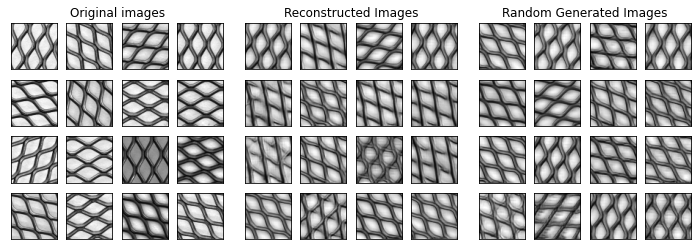

Epoch 10/25
383/785 [=============>................] - ETA: 10:38 - d_loss: 0.1365 - g_loss: 0.8109 - e_loss: 0.8299 - id_loss: 0.2903

In [ ]:
EPOCHS = 25

gan = BIGAN(discriminator=d_model,
              generator=g_model,
              encoder=e_model,
              latent_dim=noise_dim,
              id_weight=0.1)


gan.compile(
    d_optimizer=discriminator_optimizer,
    g_optimizer=generator_optimizer,
    e_optimizer=encoder_optimizer,
    g_loss_fn=generator_loss,
    d_loss_fn=discriminator_loss,
    e_loss_fn=encoder_loss,
    rec_loss_fn=reconstruction_loss)

gan.fit(train_ds, batch_size=BATCH_SIZE, epochs=EPOCHS, callbacks=[cbks])

In [ ]:
anim_file = 'gan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob(os.path.join(img_dir,'image*.png'))
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


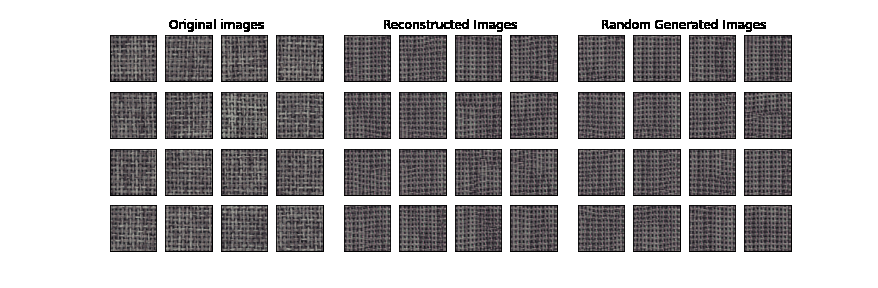

In [ ]:
embed.embed_file(anim_file)

In [ ]:
#gan.load_weights(tf.train.latest_checkpoint(checkpoint_dir))

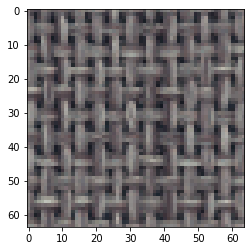

In [ ]:
noise = tf.random.normal([1, noise_dim])
generated_image = denormalize(gan.generator.predict(noise))
plt.imshow(generated_image[0, :, :, :])

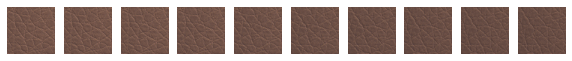

In [ ]:
from numpy import asarray
from numpy.random import randn
from numpy.random import randint
from numpy import linspace
from matplotlib import pyplot
from matplotlib.pyplot import figure


# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples, n_classes=10):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	z_input = x_input.reshape(n_samples, latent_dim)
	return z_input

# uniform interpolation between two points in latent space
def interpolate_points(p1, p2, n_steps=10):
	# interpolate ratios between the points
	ratios = linspace(0, 1, num=n_steps)
	# linear interpolate vectors
	vectors = list()
	for ratio in ratios:
		v = (1.0 - ratio) * p1 + ratio * p2
		vectors.append(v)
	return asarray(vectors)

# create a plot of generated images
def plot_generated(examples, n):
  figure(figsize=(10, 10))
	# plot images
  for i in range(n):
    # define subplot
	  pyplot.subplot(1, n, 1 + i)
		# turn off axis
	  pyplot.axis('off')
		# plot raw pixel data
	  pyplot.imshow(tf.squeeze(examples[i]), cmap='gray')
  pyplot.show()

# load model
model = gan.generator
# generate points in latent space
pts = generate_latent_points(128, 2)
# interpolate points in latent space
interpolated = interpolate_points(pts[0], pts[1])
# generate images
X = model.predict(interpolated)
# scale from [-1,1] to [0,1]
X = (X + 1) / 2.0
# plot the result
plot_generated(X, len(interpolated))

In [ ]:
tf.saved_model.save(gan, sub_path)

INFO:tensorflow:Assets written to: c:\Users\Speck\Tesi\Codes\models\carpet\FCBiGAN_256\assets
